# Imports

In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import scanpy as sc

import palantir

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [2]:
%matplotlib inline
sc.set_figure_params(frameon=False)
sns.set_style('white')
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['image.cmap'] = 'Spectral_r'
matplotlib.rcParams['figure.figsize'] = [4, 4]

# Utility funtions

In [3]:
from joblib import Parallel, delayed
from scipy.sparse import hstack, csr_matrix, issparse
import gc

def _dot_func(x, y):
    return x.dot(y)


def impute_data(dm_res, ad, n_steps=3):
    T_steps = dm_res['T'] ** n_steps
    T_steps = T_steps.astype(np.float32)

    # RUn in parallel
    seq = np.append(np.arange(0, ad.X.shape[1], 100), [ad.X.shape[1]])
    res = Parallel(n_jobs=-1)(delayed(_dot_func)(T_steps, ad.X[:, seq[i - 1]:seq[i]]) for i in range(1, len(seq)))
    imputed_data = hstack(res)
    imputed_data = imputed_data.todense()
    imputed_data[imputed_data < 1e-2] = 0
    gc.collect()

    ad.layers['MAGIC_imputed_data'] = imputed_data

# Load data

In [4]:
pwd

'/fh/fast/setty_m/user/cjordan2/repositories/single-cell-primers/notebooks'

In [5]:
data_dir = os.path.expanduser('/fh/fast/setty_m/user/msetty/projects/sc-density/data/bone-marrow-tcelldep/')

In [6]:
rna_ad = sc.read(data_dir + 'bm_rna_ad.h5ad')
atac_ad = sc.read(data_dir + 'bm_atac_ad.h5ad')

In [7]:
rna_ad

AnnData object with n_obs × n_vars = 8627 × 17226
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'DoubletScores', 'n_counts', 'leiden', 'phenograph', 'log_n_counts', 'celltype', 'distance_to_closest', 'log_density', 'density', 'filtered_logdensity', 'filtered_density', 'celltype_combined', 'rna_pseudotime', 'atac_pseudotime', 'v', 'rna_log_density'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'PeakCounts'
    uns: 'celltype_combined_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'DM_EigenVectors', 'X_FDL', 'X_FDL_orig', 'X_pca', 'X_umap', 'X_umap_orig', 'rna_branch_probs'
    varm: 'PCs'
    layers: 'MAGIC_imputed_data'
    obsp: 'DMKernel', 'connectivities', 'distances', 'knn'

In [8]:
atac_ad

AnnData object with n_obs × n_vars = 8627 × 227734
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'leiden', 'phenograph', 'celltype', 'rnaPhenograph', 'rnaLeiden', 'sample', 'distance_to_closest', 'log_density', 'density', 'celltype_combined', 'rna_pseudotime', 'atac_pseudotime', 'atac_log_density'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'nearestGene', 'distToGeneStart', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx'
    uns: 'DM_EigenValues', 'GeneScoresColums', 'celltype_colors', 'celltype_combined_colors', 'leiden', 'leiden_colors', 'neighbors', 'phenograph_colors', 'rnaLeiden_colors', 'rnaPhenograph_colors', 'sample_colors', 'umap'
    obsm: 'DM_EigenVectors', 'GeneScores', 'X_Arc

## Lineages

In [9]:
import pickle 

with open(data_dir + 'lineage_cells.p', 'rb') as f:
    lineage_cells = pickle.load(f)

In [10]:
pwd


'/fh/fast/setty_m/user/cjordan2/repositories/single-cell-primers/notebooks'

# Visualizations

## Densities

In [11]:
rna_ad.obs['atac_log_density'] = atac_ad.obs['atac_log_density']
atac_ad.obs['rna_log_density'] = rna_ad.obs['rna_log_density']

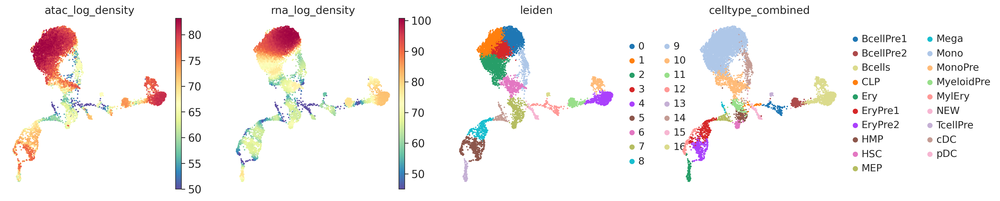

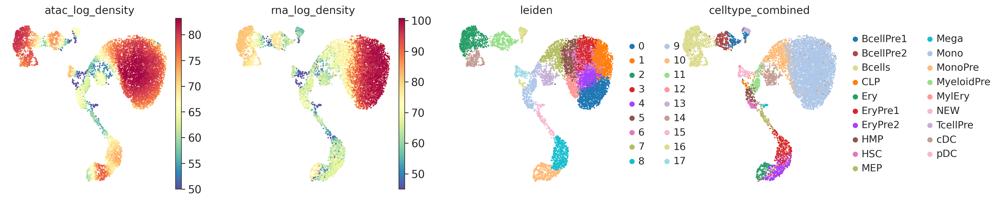

In [12]:
basis='umap'
meta = ['atac_log_density', 'rna_log_density', 'leiden',  'celltype_combined']

sc.pl.embedding(rna_ad, basis=basis, color=meta)
sc.pl.embedding(atac_ad, basis=basis, color=meta)

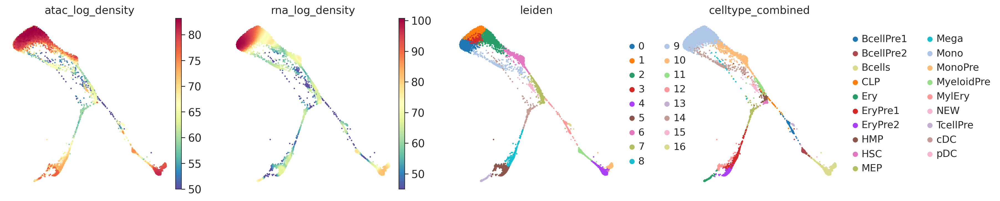

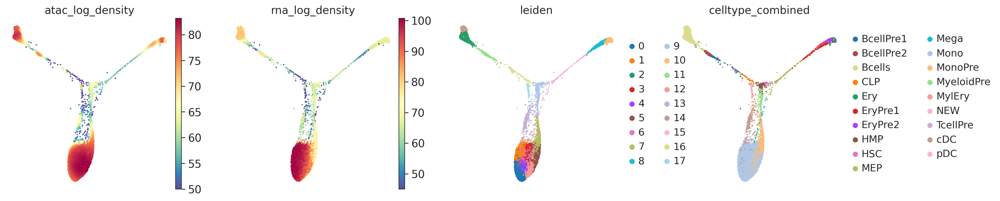

In [13]:
basis='FDL'
sc.pl.embedding(rna_ad, basis=basis, color=meta)
sc.pl.embedding(atac_ad, basis=basis, color=meta)

## Pseudo-time

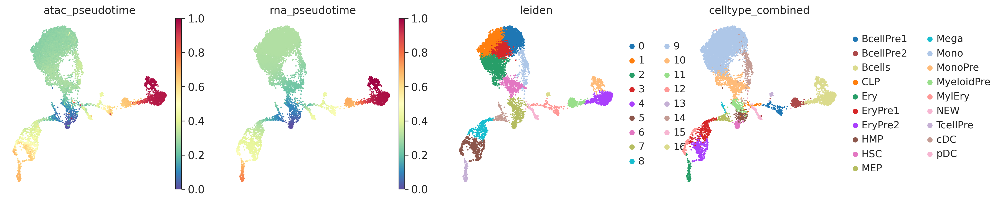

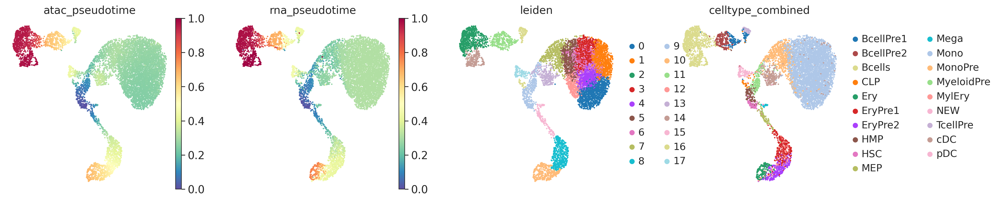

In [14]:
basis='umap'
meta = ['atac_pseudotime', 'rna_pseudotime', 'leiden',  'celltype_combined']

sc.pl.embedding(rna_ad, basis=basis, color=meta)
sc.pl.embedding(atac_ad, basis=basis, color=meta)

## Lineages

In [15]:
n_lineages = len(lineage_cells)
ct_colors = pd.Series(rna_ad.uns['celltype_combined_colors'], 
                     index=rna_ad.obs['celltype_combined'].values.categories)

In [16]:
# Adjust pDC
lin = 'pDC'
cells = lineage_cells[lin]
cells = cells[rna_ad.obs['celltype_combined'][cells] != 'MyeloidPre']
lineage_cells[lin] = cells

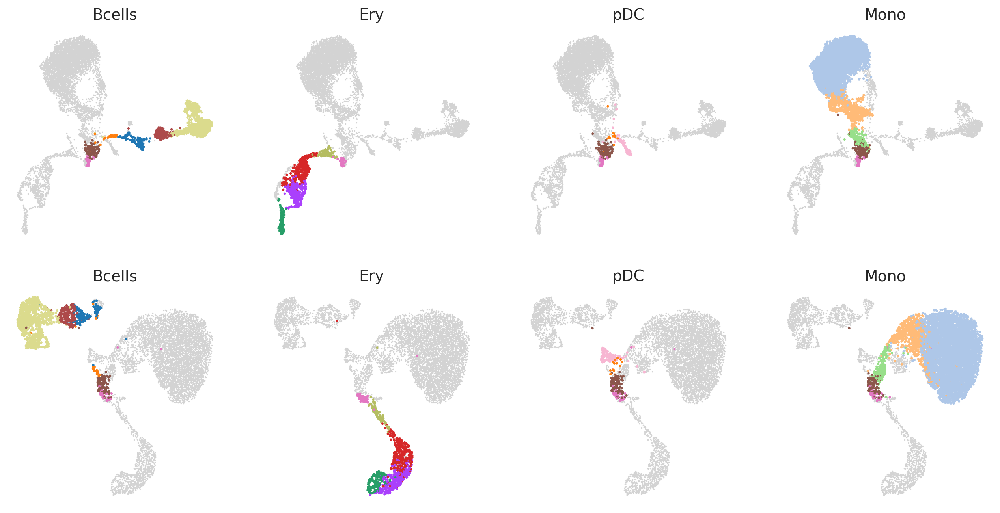

In [17]:
basis = 'X_umap'

fig = plt.figure(figsize=[4 * n_lineages, 4 * 2])

for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1)
    ax.scatter(
        rna_ad.obsm[basis][:, 0], 
        rna_ad.obsm[basis][:, 1], 
        s=0.25, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        rna_ad[cells].obsm[basis][:, 0], 
        rna_ad[cells].obsm[basis][:, 1], 
        s=2, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
    )
    ax.set_axis_off()
    ax.set_title(lin)
    
for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1 + n_lineages)
    ax.scatter(
        atac_ad.obsm[basis][:, 0], 
        atac_ad.obsm[basis][:, 1], 
        s=0.25, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        atac_ad[cells].obsm[basis][:, 0], 
        atac_ad[cells].obsm[basis][:, 1], 
        s=2, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
    )
    ax.set_axis_off()
    ax.set_title(lin)

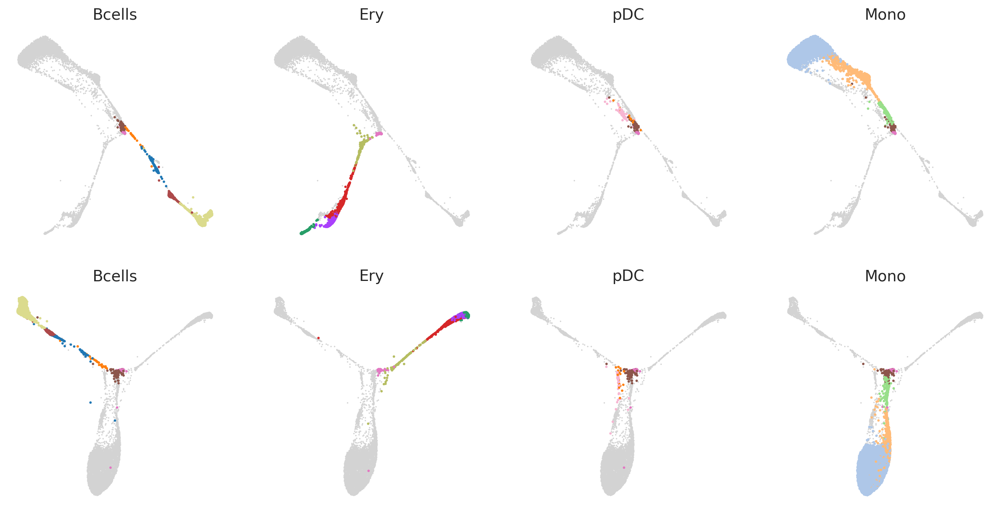

In [18]:
basis = 'X_FDL'

fig = plt.figure(figsize=[4 * n_lineages, 4 * 2])

for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1)
    ax.scatter(
        rna_ad.obsm[basis][:, 0], 
        rna_ad.obsm[basis][:, 1], 
        s=0.25, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        rna_ad[cells].obsm[basis][:, 0], 
        rna_ad[cells].obsm[basis][:, 1], 
        s=2, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
    )
    ax.set_axis_off()
    ax.set_title(lin)
    
for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1 + n_lineages)
    ax.scatter(
        atac_ad.obsm[basis][:, 0], 
        atac_ad.obsm[basis][:, 1], 
        s=0.25, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        atac_ad[cells].obsm[basis][:, 0], 
        atac_ad[cells].obsm[basis][:, 1], 
        s=2, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
    )
    ax.set_axis_off()
    ax.set_title(lin)

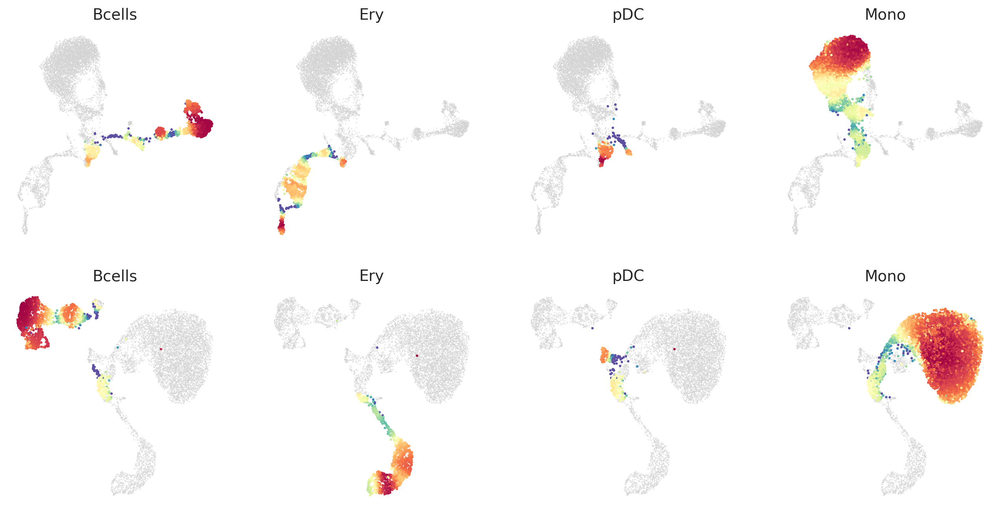

In [19]:
basis = 'X_umap'

fig = plt.figure(figsize=[4 * n_lineages, 4 * 2])

for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1)
    ax.scatter(
        rna_ad.obsm[basis][:, 0], 
        rna_ad.obsm[basis][:, 1], 
        s=0.05, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        rna_ad[cells].obsm[basis][:, 0], 
        rna_ad[cells].obsm[basis][:, 1], 
        s=2, c=rna_ad[cells].obs['rna_log_density']
    )
    ax.set_axis_off()
    ax.set_title(lin)
    
for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1 + n_lineages)
    ax.scatter(
        atac_ad.obsm[basis][:, 0], 
        atac_ad.obsm[basis][:, 1], 
        s=0.05, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        atac_ad[cells].obsm[basis][:, 0], 
        atac_ad[cells].obsm[basis][:, 1], 
        s=2, c=atac_ad[cells].obs['atac_log_density']
    )
    ax.set_axis_off()
    ax.set_title(lin)

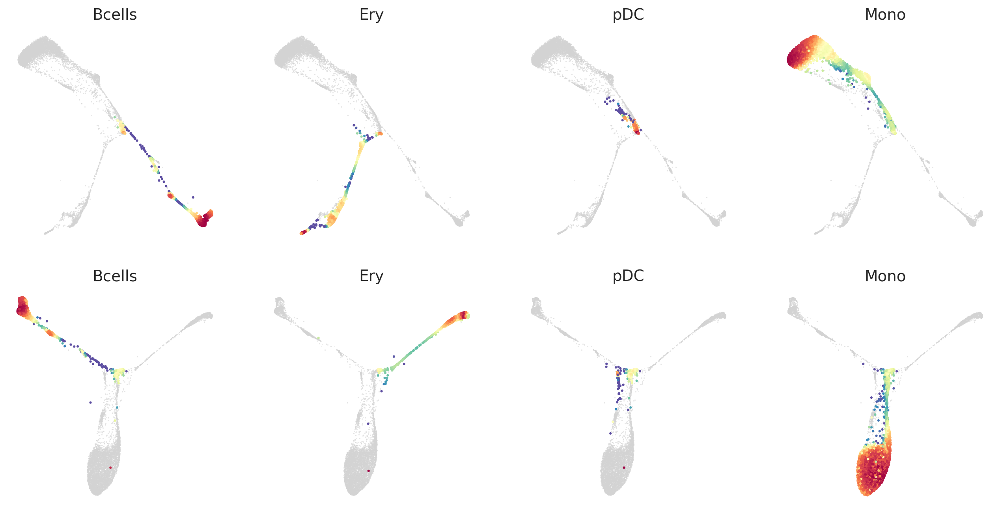

In [20]:
basis = 'X_FDL'

fig = plt.figure(figsize=[4 * n_lineages, 4 * 2])

for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1)
    ax.scatter(
        rna_ad.obsm[basis][:, 0], 
        rna_ad.obsm[basis][:, 1], 
        s=0.05, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        rna_ad[cells].obsm[basis][:, 0], 
        rna_ad[cells].obsm[basis][:, 1], 
        s=2, c=rna_ad[cells].obs['rna_log_density']
    )
    ax.set_axis_off()
    ax.set_title(lin)
    
for i, lin in enumerate(lineage_cells.keys()):
    ax = fig.add_subplot(2, n_lineages, i + 1 + n_lineages)
    ax.scatter(
        atac_ad.obsm[basis][:, 0], 
        atac_ad.obsm[basis][:, 1], 
        s=0.05, color='lightgrey'
    )
    
    cells = lineage_cells[lin]
    ax.scatter(
        atac_ad[cells].obsm[basis][:, 0], 
        atac_ad[cells].obsm[basis][:, 1], 
        s=2, c=atac_ad[cells].obs['atac_log_density']
    )
    ax.set_axis_off()
    ax.set_title(lin)

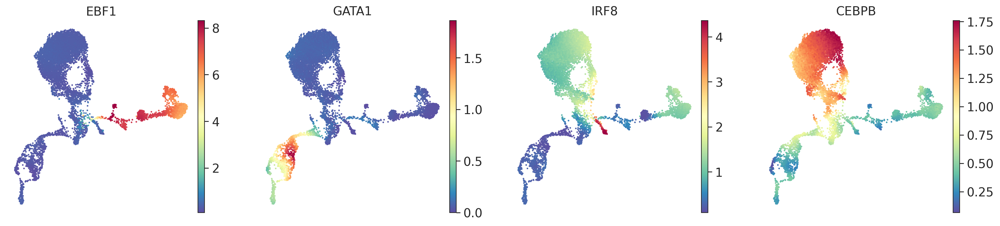

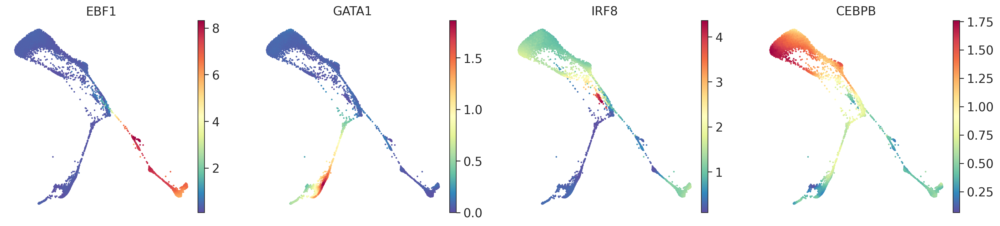

In [21]:
master_regulators = pd.Series(['EBF1', 'GATA1', 'IRF8', 'CEBPB'], 
                             index=lineage_cells.keys())
for basis in ['umap', 'FDL']:
    sc.pl.embedding(rna_ad, basis=basis, layer='MAGIC_imputed_data',
                color=master_regulators)


## Densities and Clusters 

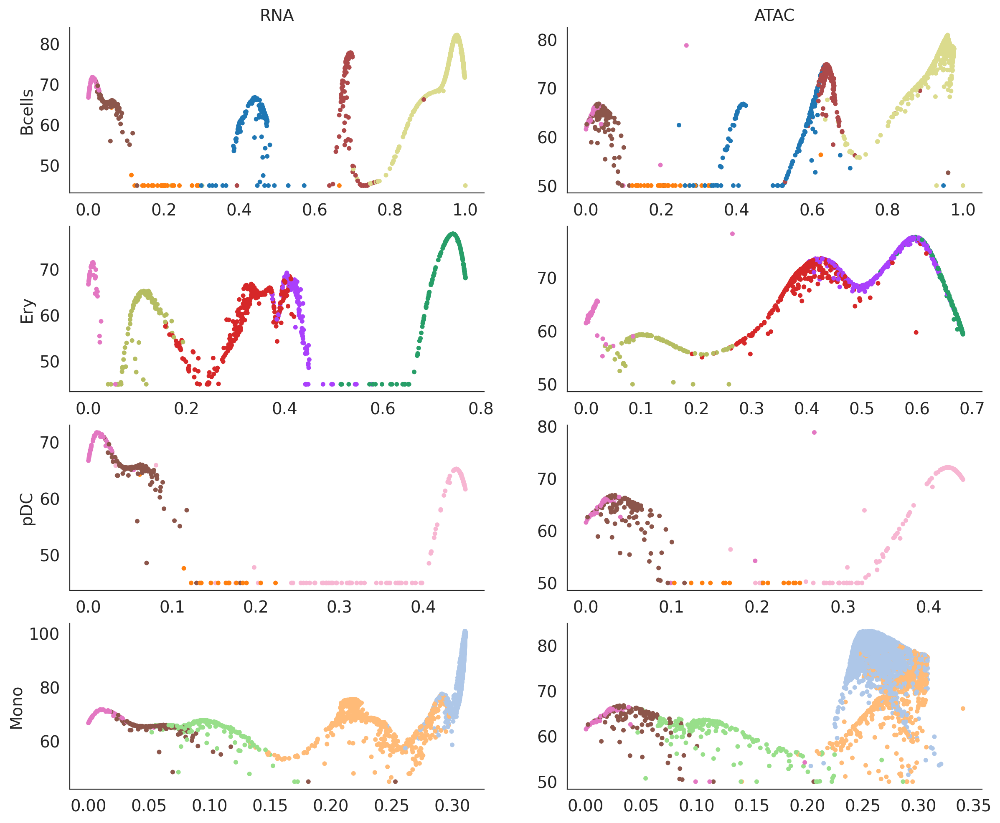

In [22]:
# leiden_colors = pd.Series(rna_ad.uns['leiden_colors'], 
#                          index=rna_ad.obs['leiden'].values.categories)

fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               rna_ad[cells].obs['rna_log_density'], 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')

    
# ATAC
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(rna_ad[cells].obs['atac_pseudotime'], 
               rna_ad[cells].obs['atac_log_density'], 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    if i == 0:
        ax.set_title('ATAC')
    
    
    # ax.set_ylabel('RNA density')
sns.despine()

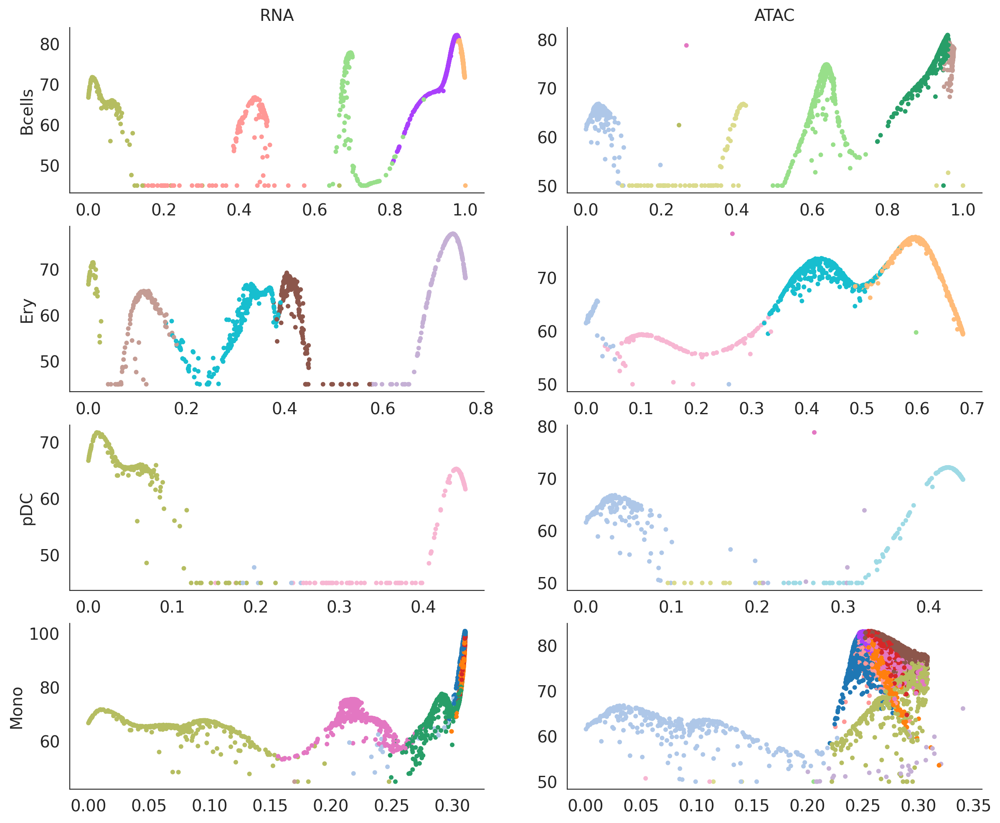

In [23]:
fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
leiden_colors = pd.Series(rna_ad.uns['leiden_colors'], 
                         index=rna_ad.obs['leiden'].values.categories)
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               rna_ad[cells].obs['rna_log_density'], 
                s=10, color=leiden_colors[rna_ad[cells].obs['leiden']]
               )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')
    
# ATAC
leiden_colors = pd.Series(atac_ad.uns['leiden_colors'], 
                         index=atac_ad.obs['leiden'].values.categories)
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(rna_ad[cells].obs['atac_pseudotime'], 
               rna_ad[cells].obs['atac_log_density'], 
                s=10, color=leiden_colors[atac_ad[cells].obs['leiden']]
               )
    if i == 0:
        ax.set_title('ATAC')
    
    
    # ax.set_ylabel('RNA density')
sns.despine()

# Densities and lineage probabilities

In [24]:
rna_ad

AnnData object with n_obs × n_vars = 8627 × 17226
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'DoubletScores', 'n_counts', 'leiden', 'phenograph', 'log_n_counts', 'celltype', 'distance_to_closest', 'log_density', 'density', 'filtered_logdensity', 'filtered_density', 'celltype_combined', 'rna_pseudotime', 'atac_pseudotime', 'v', 'rna_log_density', 'atac_log_density'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'PeakCounts'
    uns: 'celltype_combined_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'sample_colors', 'umap', 'leiden_colors'
    obsm: 'DM_EigenVectors', 'X_FDL', 'X_FDL_orig', 'X_pca', 'X_umap', 'X_umap_orig', 'rna_branch_probs'
    varm: 'PCs'
    layers: 'MAGIC_imputed_data'
    obsp: 'DMKernel', 'connectivities', 'distances', 'knn'

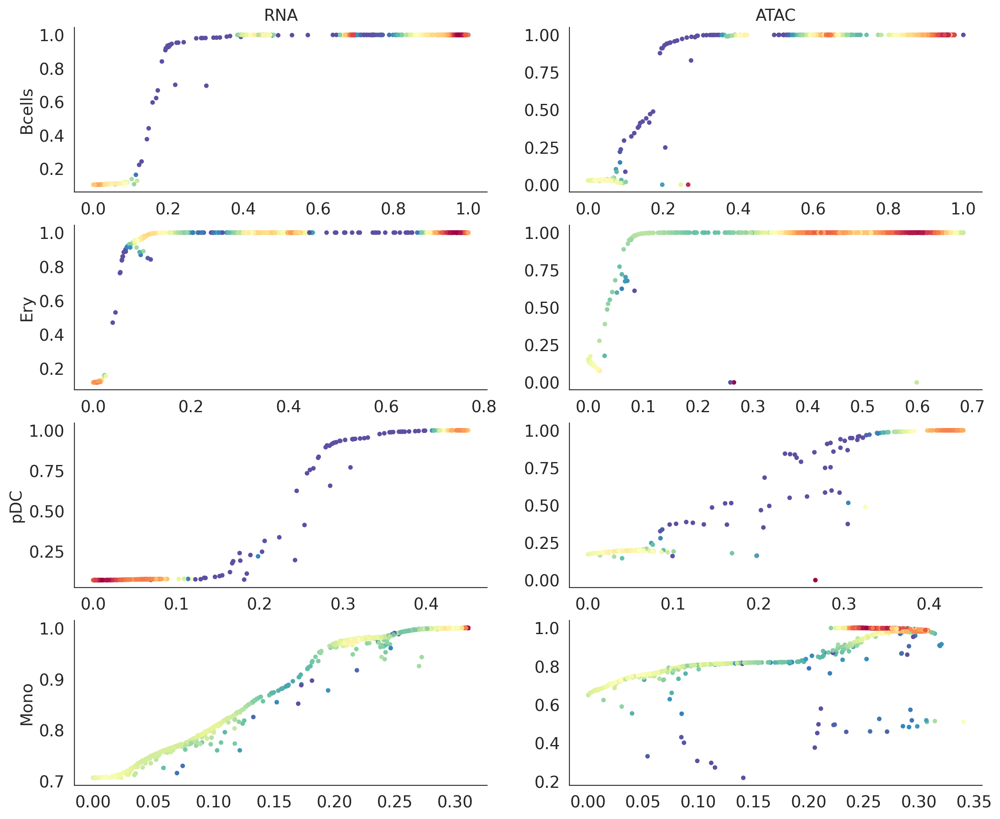

In [25]:

fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    
    prob = rna_ad[cells].obsm['rna_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + rna_ad[cells].obsm['rna_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               prob,
                s=10, c=rna_ad[cells].obs['rna_log_density'],
               # cmap=matplotlib.cm.Blues, 
               # edgecolor='black', linewidth=0.5
              )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')
        
    
#     ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
#     ax.scatter(atac_ad[cells].obs['rna_pseudotime'], 
#                prob, 
#                 s=10, c=rna_ad[cells].obs['atac_log_density']
#                )
#     if i == 0:
#         ax.set_title('ATAC')

sns.despine()
    
# ATAC
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]

    prob = atac_ad[cells].obsm['atac_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + atac_ad[cells].obsm['atac_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(atac_ad[cells].obs['atac_pseudotime'], 
               prob, 
                s=10, c=rna_ad[cells].obs['atac_log_density']
               )
    if i == 0:
        ax.set_title('ATAC')
sns.despine()

# RNA -vs- ATAC comparison

## Two questions
Does ATAC density change precede RNA density changes? 

Are ATAC density changes less pronounced than RNA density changes ?


## Density trends

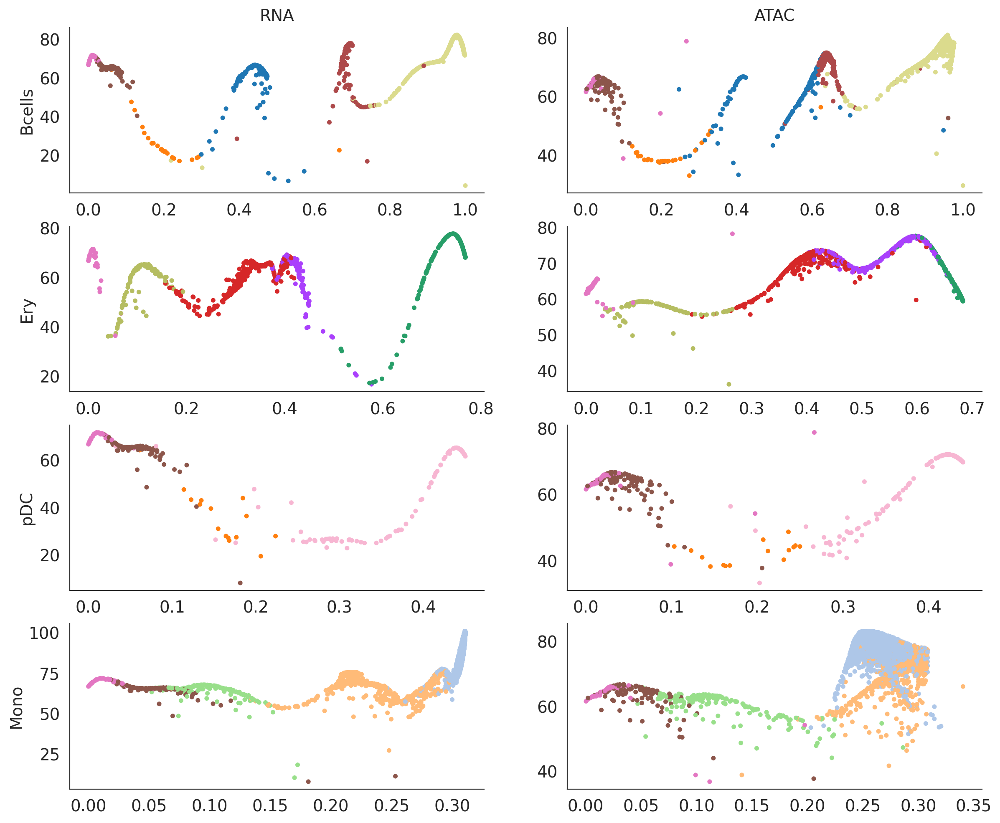

In [26]:
# leiden_colors = pd.Series(rna_ad.uns['leiden_colors'], 
#                          index=rna_ad.obs['leiden'].values.categories)

fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               rna_ad[cells].obs['log_density'], 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')

    
# ATAC
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(rna_ad[cells].obs['atac_pseudotime'], 
               atac_ad[cells].obs['log_density'], 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    if i == 0:
        ax.set_title('ATAC')
    
    
    # ax.set_ylabel('RNA density')
sns.despine()

## Mapping

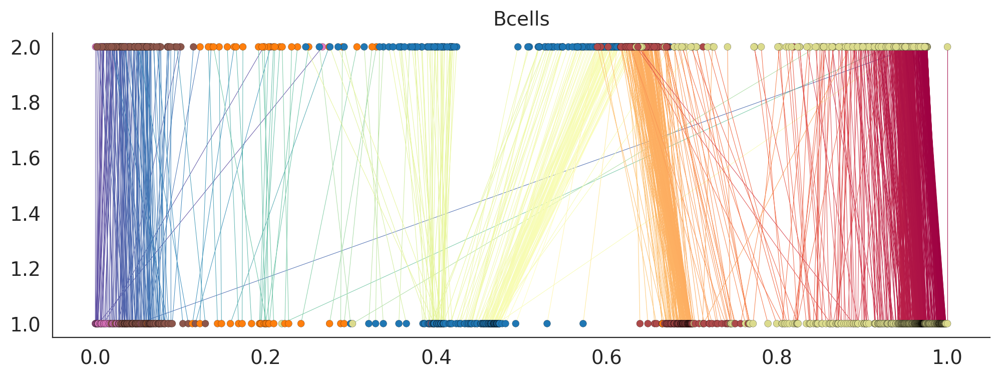

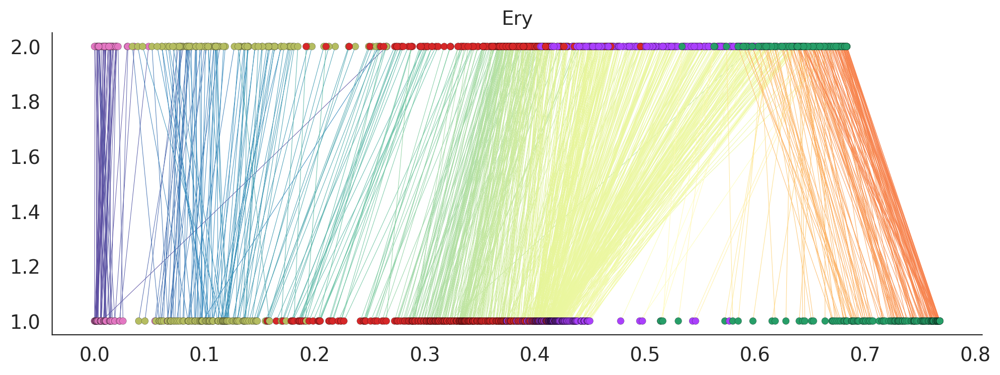

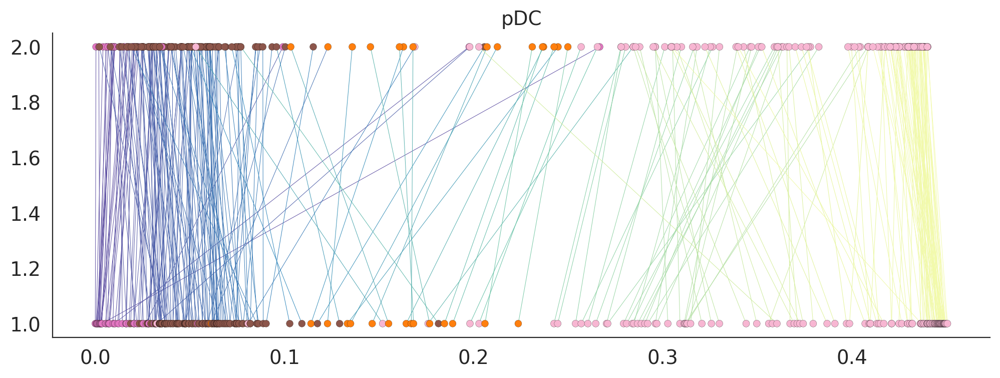

In [ ]:
for lin in lineage_cells.keys():
    cells = lineage_cells[lin]
    cells = rna_ad.obs['rna_pseudotime'][cells].sort_values().index
    rna_pt = rna_ad.obs['rna_pseudotime'][cells]
    atac_pt = rna_ad.obs['atac_pseudotime'][cells]

    plt.figure(figsize=[12, 4])
    for cell in cells:
        plt.plot(
            [rna_pt[cell], atac_pt[cell]],
            [1, 2],
            c=matplotlib.cm.Spectral_r(rna_ad[cell].obs['rna_pseudotime']),
            # color='lightgrey', 
            linewidth=0.35, zorder=1 
        )


    # RNA
    plt.scatter(
        rna_pt, 
        np.repeat(1, len(cells)),
        s=25, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
        edgecolor='black', linewidth=0.1, zorder=2
    )

    plt.scatter(
        atac_pt,
        np.repeat(2, len(cells)),
        s=25, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
        edgecolor='black', linewidth=0.1, zorder=2
    )
    
    plt.title(lin)
    
    # plt.ylim([0.5, 2.5])

    sns.despine()
    

In [ ]:
for lin in lineage_cells.keys():
    cells = lineage_cells[lin]
    cells = rna_ad.obs['rna_pseudotime'][cells].sort_values().index
    rna_pt = pd.Series(rankdata(rna_ad.obs['rna_pseudotime'][cells]), 
                     index=cells)
    atac_pt = pd.Series(rankdata(rna_ad.obs['atac_pseudotime'][cells]), 
                     index=cells)

    plt.figure(figsize=[12, 4])
    for cell in cells:
        plt.plot(
            [rna_pt[cell], atac_pt[cell]],
            [1, 2],
            c=matplotlib.cm.Spectral_r(rna_ad[cell].obs['rna_pseudotime']),
            # color='lightgrey', 
            linewidth=0.35, zorder=1 
        )


    # RNA
    plt.scatter(
        rna_pt, 
        np.repeat(1, len(cells)),
        s=25, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
        edgecolor='black', linewidth=0.1, zorder=2
    )

    plt.scatter(
        atac_pt,
        np.repeat(2, len(cells)),
        s=25, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
        edgecolor='black', linewidth=0.1, zorder=2
    )
    
    plt.title(lin)
    
    # plt.ylim([0.5, 2.5])

    sns.despine()
    

## Trend fits

In [ ]:
from sklearn.preprocessing import minmax_scale
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel


# kernel = C(1.0, constant_value_bounds='fixed') * RBF(1, (1e-2, 1e2)) + WhiteKernel() 
kernel = C(0.5, constant_value_bounds='fixed') * RBF(0.1, 'fixed') + WhiteKernel()



In [ ]:
lin = 'pDC'
cells = lineage_cells[lin]

cells = cells[rna_ad.obs['celltype_combined'][cells] != 'Mono']

plt.figure(figsize=[7, 3])
# RNA
x = rna_ad.obs['rna_pseudotime'][cells].values.reshape(-1, 1)
y = minmax_scale(rna_ad.obs['log_density'][cells], [0, 1])
rna_gp = GaussianProcessRegressor(kernel=kernel)
rna_gp.fit(x, y)
pred_x = np.linspace(0, np.max(x), 50).reshape(-1, 1)
pred_y =  rna_gp.predict(pred_x)
plt.scatter(x, y, s=1)
plt.plot(pred_x, pred_y, linewidth=3, label='RNA')
# plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='RNA')
sns.despine()

# ATAC
x = rna_ad.obs['atac_pseudotime'][cells].values.reshape(-1, 1)
y = minmax_scale(atac_ad.obs['log_density'][cells], [0, 1])
atac_gp = GaussianProcessRegressor(kernel=kernel)
atac_gp.fit(x, y)
pred_x = np.linspace(0, np.max(x), 50).reshape(-1, 1)
pred_y =  atac_gp.predict(pred_x)
plt.scatter(x, y, s=1)
plt.plot(pred_x, pred_y, linewidth=3, label='ATAC')
# plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='ATAC')
sns.despine()

plt.legend(loc=2, bbox_to_anchor=(1, 1))

In [ ]:
plt.figure(figsize=[7, 3])

x = rna_ad.obs['rna_pseudotime'][cells].values
rna_pred = pd.Series(rna_gp.predict(x.reshape(-1, 1)), index=cells)
plt.scatter(x, rna_pred, s=20, linewidth=0.1, edgecolor='black')
atac_pred = pd.Series(atac_gp.predict(x.reshape(-1, 1)), index=cells)
plt.scatter(
    x,
    atac_pred, 
    s=20, linewidth=0.1, edgecolor='black'
)

# Second fit for visualization
pred_x = np.linspace(0, np.max(x), 50).reshape(-1, 1)

# RNA
gp = GaussianProcessRegressor(kernel=kernel)
gp.fit(x.reshape(-1, 1), rna_pred)
rna_refit = gp
pred_y =  gp.predict(pred_x)
plt.plot(pred_x, pred_y, linewidth=0.25, label='RNA')

# ATAC
gp = GaussianProcessRegressor(kernel=kernel)
gp.fit(x.reshape(-1, 1), atac_pred)
atac_refit = gp
pred_y =  gp.predict(pred_x)
plt.plot(pred_x, pred_y, linewidth=0.25, label='ATAC')


sns.despine()
plt.legend(loc=2, bbox_to_anchor=(1, 1))
plt.scatter(rna_ad.obs['rna_pseudotime'][cells], 
           np.repeat(plt.ylim()[0] - 0.05, len(cells)), 
           s=20, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
           edgecolor='black', linewidth=0.25)

In [ ]:
# Question 1

plt.figure(figsize=[7, 3])

# RNA
pred_y =  rna_refit.predict(pred_x)
plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='RNA')

# # ATAC
pred_y =  atac_refit.predict(pred_x)
plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='ATAC')


sns.despine()
plt.legend(loc=2, bbox_to_anchor=(1, 1))
plt.scatter(rna_ad.obs['rna_pseudotime'][cells], 
           np.repeat(plt.ylim()[0] - 0.025, len(cells)), 
           s=20, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
           edgecolor='black', linewidth=0.25)

In [ ]:
# Question 2

plt.figure(figsize=[7, 3])

# RNA
x = rna_ad.obs['rna_pseudotime'][cells].values.reshape(-1, 1)
pred_x = np.linspace(0, np.max(x), 50).reshape(-1, 1)
pred_y =  rna_gp.predict(pred_x)
plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='RNA')

# # ATAC
x = rna_ad.obs['atac_pseudotime'][cells].values.reshape(-1, 1)
pred_x = np.linspace(0, np.max(x), 50).reshape(-1, 1)
pred_y =  atac_refit.predict(pred_x)
plt.plot(pred_x[1:, 0], np.diff(pred_y), linewidth=3, label='ATAC')


sns.despine()
plt.legend(loc=2, bbox_to_anchor=(1, 1))
plt.scatter(rna_ad.obs['rna_pseudotime'][cells], 
           np.repeat(plt.ylim()[0] - 0.025, len(cells)), 
           s=20, color=ct_colors[rna_ad.obs['celltype_combined'][cells]], 
           edgecolor='black', linewidth=0.25)

# Features corresponding to low density regins

In [ ]:
!pwd

Analysis using the first two high density B-cell regions

In [ ]:
lin = 'Bcells'
gene = 'EBF1'

cells = lineage_cells[lin]
exprs = np.ravel(rna_ad[cells][:, gene].layers['MAGIC_imputed_data'].todense())
# exprs = np.ravel(rna_ad[cells][:, gene].X.todense())

fig = plt.figure(figsize=[7 * 2, 3 * 2])
ax = fig.add_subplot(221)
ax.scatter(rna_ad[cells].obs['log_density'], 
           exprs,
            s=10, 
           c=rna_ad[cells].obs['rna_pseudotime'], 
           )
ax = fig.add_subplot(223)
ax.scatter(rna_ad[cells].obs['log_density'], 
           exprs,
            s=10, 
           color=ct_colors[rna_ad[cells].obs['celltype_combined']], 
           )
ax = fig.add_subplot(222)
ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           exprs,
            s=10, 
           color=ct_colors[rna_ad[cells].obs['celltype_combined']], 
           )
ax = fig.add_subplot(224)
ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           rna_ad[cells].obs['log_density'], 
            s=10, 
           color=ct_colors[rna_ad[cells].obs['celltype_combined']], 
           )

sns.despine()



In [ ]:
set1 = cells[(rna_ad[cells].obs['rna_pseudotime'] < 0.1) & (rna_ad[cells].obs['log_density'] > 50)]
set2 = cells[(rna_ad[cells].obs['rna_pseudotime'] > 0.4) &\
             (rna_ad[cells].obs['rna_pseudotime'] < 0.45) &\
             (rna_ad[cells].obs['log_density'] > 50)
            ]
set3 = cells[(rna_ad[cells].obs['rna_pseudotime'] > 0.1) &\
             (rna_ad[cells].obs['rna_pseudotime'] < 0.4) &\
             (rna_ad[cells].obs['log_density'] < 50)
            ]
print(len(set1), len(set2), len(set3))
subset = set1.union(set2).union(set3)

temp = rna_ad[subset]
s = pd.Series(object, index=subset)
s[set1], s[set2], s[set3] = 'S1', 'S2', 'S3'
temp.obs['S'] = s

sc.pl.embedding(temp, basis='umap', color=['S', 'celltype_combined', 'rna_log_density'])

## Mutual information

In [ ]:
x = rna_ad.obs['log_density'][subset]
y = np.ravel(rna_ad[subset][:, gene].layers['MAGIC_imputed_data'].todense())

fig = plt.figure(figsize=[4 * 3, 4])


hist_2d, x_edges, y_edges = np.histogram2d(
    x, y,
    bins=40)
ax = fig.add_subplot(131)
ax.imshow(hist_2d.T, origin='lower')


hist_2d_log = np.zeros(hist_2d.shape)
non_zeros = hist_2d != 0
hist_2d_log[non_zeros] = np.log(hist_2d[non_zeros]  + 1)
ax = fig.add_subplot(132)
ax.imshow(hist_2d_log.T, origin='lower')


hist_2d_bin = hist_2d.copy()
hist_2d_bin[hist_2d_bin != 0 ]= 1
ax = fig.add_subplot(133)
ax.imshow(hist_2d_bin.T, origin='lower')


In [ ]:
>>> def mutual_information(hgram):
...     """ Mutual information for joint histogram
...     """
...     # Convert bins counts to probability values
...     pxy = hgram / float(np.sum(hgram))
...     px = np.sum(pxy, axis=1) # marginal for x over y
...     py = np.sum(pxy, axis=0) # marginal for y over x
...     px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
...     # Now we can do the calculation using the pxy, px_py 2D arrays
...     nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
...     return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

In [ ]:
print(mutual_information(hist_2d_bin), mutual_information(hist_2d_log), mutual_information(hist_2d))



In [ ]:
# Mutual information - log
mi_log = pd.Series(0.0, index=rna_ad.var_names)
for gene in tqdm(mi.index):
    x = rna_ad[subset].obs['log_density']
    y = np.ravel(rna_ad[subset][:, gene].layers['MAGIC_imputed_data'].todense())
    
    hist_2d, x_edges, y_edges = np.histogram2d(x, y, bins=40)
    hist_2d_log = np.log(hist_2d + 1)
    mi_log[gene] = mutual_information(hist_2d_log)

### TFs

In [ ]:
tfs = pd.read_table('/fh/fast/setty_m/grp/gene_sets/AnimalTFDB/v3.0/Homo_sapiens_TF.txt')['Symbol'].values
high_tfs = mi_log[mi_log.index.intersection(tfs)].sort_values()[::-1][:10]
high_tfs

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', color=high_tfs.index, use_raw=False, 
               layer='MAGIC_imputed_data', ncols=5)

### Receptors

In [ ]:
receptors = pd.read_csv('/fh/fast/setty_m/user/cdien/niche_net_networks/rec_tf.csv', index_col=0).index

In [ ]:
high_receptors = mi_log[mi_log.index.intersection(receptors)].sort_values()[::-1][:10]
high_receptors

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', color=high_receptors.index, use_raw=False, 
               layer='MAGIC_imputed_data', ncols=5)

## Differential expression

In [ ]:
sc.pl.embedding(temp, basis='umap', color=['S', 'celltype_combined', 'rna_log_density'])

In [ ]:
# Subsets
t1 = temp[temp.obs['S'].isin(['S1', 'S3'])]
t2 = temp[temp.obs['S'].isin(['S2', 'S3'])]

# Differential expression
sc.tl.rank_genes_groups(t1, 'S', use_raw=False)
sc.tl.rank_genes_groups(t2, 'S', use_raw=False)

# Top genes
df1 = sc.get.rank_genes_groups_df(t1, 'S3')
df2 = sc.get.rank_genes_groups_df(t2, 'S3')
df1.index = df1['names']
df2.index = df2['names']

# Genes 
diff_genes = df1.index[(df1['logfoldchanges'] > 1.5) & (df1['pvals_adj'] < 1e-2)].intersection(
    df2.index[(df2['logfoldchanges'] > 1.5) & (df2['pvals_adj'] < 1e-2)]
)

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', color=diff_genes, use_raw=False, 
               layer='MAGIC_imputed_data', ncols=5)

# SCRATCH

In [ ]:
rna_ad

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', color=['rna_pseudotime', 'celltype_combined'])

In [ ]:
# dm_res = palantir.utils.run_diffusion_maps(rna_ad.obsp['DM_Kernel'])
# dm_res['EigenVectors'].index = rna_ad.obs_names

# Startcell
palantir.plot.plot_gene_expression(
    pd.DataFrame(rna_ad.obsm['DM_EigenVectors'], index=rna_ad.obs_names),
    pd.DataFrame(rna_ad.obsm['X_umap'], index=rna_ad.obs_names, columns=['x', 'y']), 
    np.arange(rna_ad.obsm['DM_EigenVectors'].shape[1]), n_cols=5
)

In [ ]:
index = 3
sns.kdeplot(dm_res['EigenVectors'][index])

In [ ]:
from scipy.stats import gaussian_kde


cells = lineage_cells['Mono']
x = rna_ad.obs['rna_pseudotime'][cells].values, 

z = gaussian_kde(x)(x)



In [ ]:
ct_colors = pd.Series(rna_ad.uns['celltype_combined_colors'], 
                     index=rna_ad.obs['celltype_combined'].values.categories)

In [ ]:
temp = rna_ad[cells,:]

In [ ]:
plt.figure(figsize=[7, 3])
plt.scatter(x, np.log(z), s=5)

plt.figure(figsize=[7, 3])
plt.scatter(rna_ad.obs['rna_pseudotime'][cells],
            rna_ad.obs['log_density'][cells],
            color=ct_colors[rna_ad.obs['celltype_combined'][cells]],
     s=5)

In [ ]:
temp.obs['kde'] = z

In [ ]:
sc.pl.embedding(temp, basis='umap', color=['rna_pseudotime', 'log_density', 'kde',
                                                    'celltype_combined'])

In [ ]:
temp = sc.read('/fh/fast/setty_m/user/msetty/projects/sc-density/data/kp-tracer-lung-gemm/KPTracer-Data/expression/adata_processed.nt.h5ad')

In [ ]:
temp

In [ ]:
sc.pl.embedding(temp, basis='umap', 
               color=['Cluster-Name', 'is_normal', ])

In [ ]:
temp.raw.X.max()

In [ ]:
n_bins = 10
rna_bins = pd.Series(
    np.digitize(rna_ad.obs['rna_pseudotime'][cells], 
           np.linspace(0, 1, n_bins)), 
                    index=cells)
atac_bins = pd.Series(
    np.digitize(rna_ad.obs['atac_pseudotime'][cells], 
           np.linspace(0, 1, n_bins)), 
                    index=cells)

bin_mapping = pd.Series(-1, index=np.arange(n_bins))
for i in np.arange(n_bins):
    subset = rna_bins.index[rna_bins == i]
    if len(subset) == 0:
        continue
    bin_mapping[i] = int(atac_bins[subset].value_counts().idxmax())
bin_mampping = bin_mapping[bin_mapping != -1]

In [ ]:
plt.figure(figsize=[7, 3])

plot_points = np.linspace(0, 1, n_bins)

x = plot_points[bin_mapping.index]
rna_pred = rna_gp.predict(x.reshape(-1, 1))
plt.plot(x, rna_pred, linewidth=3, label='RNA')

x = plot_points[bin_mapping.values]
atac_pred = atac_gp.predict(x.reshape(-1, 1))
x = plot_points[bin_mapping.index]
plt.plot(x, atac_pred, linewidth=3, label='ATAC')


# x = rna_ad.obs['rna_pseudotime'][cells].values
# atac_pred = pd.Series(atac_gp.predict(x.reshape(-1, 1)), index=cells)
# plt.plot(
#     rna_ad.obs['rna_pseudotime'][cells].values,
#             atac_pred, 
#     linewidth=3, label='ATAC'
        
#            )
sns.despine()
plt.legend(loc=2, bbox_to_anchor=(1, 1))

In [ ]:
bin_mapping

In [ ]:
plt.figure(figsize=[7, 3])
# RNA
x = minmax_scale(rna_ad.obs['rna_pseudotime'][cells], [0, 1]).reshape(-1, 1)
y = minmax_scale(rna_ad.obs['log_density'][cells], [0, 1])
gp.fit(x, y)
pred_x = np.linspace(0, 1, 50).reshape(-1, 1)
pred_y =  gp.predict(pred_x)
plt.scatter(x, y, s=5)
# plt.plot(pred_x, pred_y, linewidth=3, label='RNA')
sns.despine()

# ATAC
x = minmax_scale(rna_ad.obs['atac_pseudotime'][cells], [0, 1]).reshape(-1, 1)
y = minmax_scale(atac_ad.obs['log_density'][cells], [0, 1])
gp.fit(x, y)
pred_x = np.linspace(0, 1, 50).reshape(-1, 1)
pred_y =  gp.predict(pred_x)
plt.scatter(x, y, s=5)
# plt.plot(pred_x, pred_y, linewidth=3, label='ATAC')
sns.despine()

# plt.legend(loc=2, bbox_to_anchor=(1, 1))

In [ ]:
sns.kdeplot(rna_ad[cells].obs['rna_pseudotime'])
sns.kdeplot(atac_ad[cells].obs['atac_pseudotime'])

In [ ]:
plt.figure(figsize=[7, 3])

c = minmax_scale(rna_ad.obs['rna_log_density'][cells], [0, 1])
plt.scatter(
    rna_ad.obs['rna_pseudotime'][cells], c,
    s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
            )

c = minmax_scale(rna_ad.obs['atac_log_density'][cells], [0, 1])
plt.scatter(
    rna_ad.obs['atac_pseudotime'][cells], c,
    s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']],
           edgecolor='black', linewidth=0.25 )

# plt.xlim([plt.xlim()[0], 0.25])
sns.despine()


plt.figure(figsize=[7, 3])
c = minmax_scale(rna_ad.obs['rna_log_density'][cells], [0, 1]) - minmax_scale(rna_ad.obs['atac_log_density'][cells], [0, 1])
plt.scatter(
    rna_ad.obs['rna_pseudotime'][cells], c,
    s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']],
           edgecolor='black', linewidth=0.25 )

sns.despine()


In [ ]:
plt.scatter(rna_ad.obs['rna_log_density'][cells], 
           atac_ad.obs['atac_log_density'][cells], 
           s=5, color=ct_colors[atac_ad[cells].obs['celltype_combined']])

In [ ]:
lin = 'Bcells'
cells = lineage_cells[lin]
prob = rna_ad[cells].obsm['palantir_branch_probs'][lin]
if lin == 'Bcells':
    prob = prob + rna_ad[cells].obsm['palantir_branch_probs']['ETP']

c = pd.Series(0, cells)
c[rna_ad.obs['atac_log_density'] > rna_ad.obs['rna_log_density']] = 1
c[rna_ad.obs['atac_log_density'] < rna_ad.obs['rna_log_density']] = -1
    
plt.figure(figsize=[7, 3])
plt.scatter(
    rna_ad[cells].obs['rna_pseudotime'], 
    rna_ad[cells].obs['rna_log_density'], 
    s=10,
    c=c,
    # vmin=-5, vmax=5,
    # cmap=matplotlib.cm.RdBu_r,
           )
plt.colorbar()
sns.despine()
# plt.xlim([0.3, 0.8])

In [ ]:

fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    
    prob = rna_ad[cells].obsm['palantir_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + rna_ad[cells].obsm['palantir_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               prob,
                s=10, c=rna_ad[cells].obs['rna_log_density']
               )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')

    
# ATAC
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]

    prob = rna_ad[cells].obsm['palantir_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + atac_ad[cells].obsm['palantir_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(atac_ad[cells].obs['atac_pseudotime'], 
               prob, 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    if i == 0:
        ax.set_title('ATAC')
sns.despine()

In [ ]:
lin = 'Ery'
cells = lineage_cells[lin]

fig = plt.figure(figsize = [7 * 2, 3 * 2])

ax = fig.add_subplot(221)
ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           rna_ad[cells].obs['rna_log_density'], 
            s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
           )
ax.set_title('RNA pseudotime')
ax.set_ylabel('RNA density')

ax = fig.add_subplot(223)
plt.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           rna_ad[cells].obs['atac_log_density'], 
            s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
           )
ax.set_ylabel('ATAC density')

ax = fig.add_subplot(222)
ax.scatter(rna_ad[cells].obs['atac_pseudotime'], 
           rna_ad[cells].obs['rna_log_density'], 
            s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
           )
ax.set_title('ATAC pseudotime')

ax = fig.add_subplot(224)
plt.scatter(rna_ad[cells].obs['atac_pseudotime'], 
           rna_ad[cells].obs['atac_log_density'], 
            s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
           )


sns.despine()

In [ ]:
meta = ['rna_pseudotime', 'rna_log_density', 'atac_log_density', 'celltype_combined']

lin = 'pDC'
cells = lineage_cells[lin]

for basis in ['umap']:
    sc.pl.embedding(rna_ad[cells], basis=basis, color=meta)
    sc.pl.embedding(atac_ad[cells], basis=basis, color=meta)

In [ ]:
sc.pl.embedding(rna_ad[cells], basis='FDL', color=['leiden', 'phenograph'])

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', layer='MAGIC_imputed_data', 
               color=['GATA1', 'EBF1', 'CEBPB', 'IRF8', 'celltype_combined'])

In [ ]:
lin = 'Bcells' 
cells = lineage_cells[lin]
plt.figure(figsize=[7, 3])
ax = plt.gca()
ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           rna_ad[cells].obs['rna_log_density'], 
            s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
           )
ax.set_ylabel(lin)
sns.despine()

ax.set_xlim([0.6, 0.8])

gene = 'EBF1'
plt.figure(figsize=[7, 3])
ax = plt.gca()
ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
           rna_ad[cells].obs['rna_log_density'], 
            s=10, c=np.ravel(rna_ad[cells][:, gene].layers['MAGIC_imputed_data'])
           )
ax.set_ylabel(lin)
sns.despine()


#     if i == 0:
#         ax.set_title('RNA')
    
# # ATAC
# leiden_colors = pd.Series(atac_ad.uns['leiden_colors'], 
#                          index=atac_ad.obs['leiden'].values.categories)
# for i, lin in enumerate(lineage_cells.keys()):
#     cells = lineage_cells[lin]
#     ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
#     ax.scatter(rna_ad[cells].obs['atac_pseudotime'], 
#                rna_ad[cells].obs['atac_log_density'], 
#                 s=10, color=leiden_colors[atac_ad[cells].obs['leiden']]
#                )
#     if i == 0:
#         ax.set_title('ATAC')
    
    
#     # ax.set_ylabel('RNA density')
# sns.despine()

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', 
               layer='MAGIC_imputed_data', ncols=6,
               color=['EBF1', 'PAX5', 'IRF4', 'IRF8', 'RAG1', 'TP53', 
                     'CD34', 'CD19', 'CD24', 'MME', 'MS4A1',  'IGHA1'])

# MME CD10
# MS4A1 CD20

In [ ]:
sc.pl.embedding(rna_ad, basis='umap', 
               layer='MAGIC_imputed_data', ncols=6,
               color=['IL7R', 'RAG2', 'SOX4', 'LEF1', 'RAG1', 'CD24', 
                     'IGLL1', 'VPREB1', 'CD24', 'CD79B', ])

# PTPRC CD45
# MS4A1 CD20

In [ ]:
rna_ad.var_names[rna_ad.var_names.str.contains('VPRE')]

In [ ]:
atac_ad.obsm['atac_branch_probs'] = atac_ad.obsm['palantir_branch_probs']

In [ ]:
rna_ad.obsm['rna_branch_probs'] = rna_ad.obsm['palantir_branch_probs']

In [ ]:

fig = plt.figure(figsize=[7*2, 3 * n_lineages])

# RNA
for i, lin in enumerate(lineage_cells.keys()):
    cells = lineage_cells[lin]
    
    prob = rna_ad[cells].obsm['rna_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + rna_ad[cells].obsm['rna_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 1)
    ax.scatter(rna_ad[cells].obs['rna_pseudotime'], 
               prob,
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    ax.set_ylabel(lin)
    if i == 0:
        ax.set_title('RNA')
        
    
    prob = atac_ad[cells].obsm['atac_branch_probs'][lin]
    if lin == 'Bcells':
        prob = prob + atac_ad[cells].obsm['atac_branch_probs']['ETP']
    ax = fig.add_subplot(n_lineages, 2, i * 2 + 2)
    ax.scatter(atac_ad[cells].obs['atac_pseudotime'], 
               prob, 
                s=10, color=ct_colors[rna_ad[cells].obs['celltype_combined']]
               )
    if i == 0:
        ax.set_title('ATAC')

sns.despine()


In [ ]:
sc.read('/fh/fast/setty_m/user/cdien/asap_seq/anndatas/multiome/rna_seacells.h5ad')

In [ ]:
rna_ad

In [ ]:
sc.read('/fh/fast/setty_m/grp/lab-datasets/bonemarrow-tcell-dep-multiome/bm_multiome_atac_no_doublets_mature.h5ad')